In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# import os

# import cv2
# import skimage
# import IPython.display
import matplotlib.pyplot as plt
# import matplotlib.gridspec as gridspec

from PIL import Image
import numpy as np
from glob import glob

# from collections import OrderedDict
# import torch
# import gc

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import torch
import clip
from tqdm.notebook import tqdm
from torch.utils.data import DataLoader, Dataset

print("Torch version:", torch.__version__)

Torch version: 2.4.0+cpu


In [3]:
clip.available_models()

['RN50', 'RN101', 'RN50x4', 'RN50x16', 'ViT-B/32', 'ViT-B/16']

# Predefined Image Data

In [4]:
files = glob('*.jpeg')
files += glob('*.jpg')
print(files)

['213452132-8976.jpg', '234567890-3423.jpg', '24359056-1245.jpg', '2b9c96e2a7ca039999d255d6445ef217.jpg', '32472210918_619479f303_b.jpg', '49592284938270.jpg', '812VfL2IhbL.jpg', '982bbd5f815d9c69ac5fc10c8037dc80.jpg', 'def5dffcbde18124e4646af140664715.jpg', 'images.jpg', 'nostalgic-1960-japan-scene-toy-cars-tokyo-tower-autumn-vibes-retro-style-childhood-speed_950002-152704.jpg', 's-l1200.jpg', 's-l1600.jpg']


# Predefined Text Descriptions

In [29]:
QUERIES = [
    "A red toy car",
    "A blue toy car",
    "A pink toy car",
    "A black toy car",
    "A white toy car",
    "A silver toy car",
    "A toy car with racing stripes",
    "A toy car with big wheels",
    "A vintage toy car",
    "A toy car collection",
    "A toy car in a box",
    "A toy car with a driver inside",
    "A toy car with many passengers inside",
    "A toy car with an open roof",
    "A toy car and a toy truck",
    "A toy car on top of a toy truck",
    "A GTR toy car",
    "A Mazda toy car",
    "A Bugatti toy car",
    "Barbie toy car",
    "Two toy cars",
    "Four toy cars",
    "Eight toy cars",
    "A toy car in the UK",
    "A toy car moving in a city",
    "A police toy car"
]

In [11]:
model_viT_32, preprocess_viT_32 = clip.load("./openaiclipweights/clip/CLIP/models/ViT-B-32.pt")
model_viT_32.cpu().eval()

CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): Sequential(
        (0): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): QuickGELU()
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
        (1): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          

Description: A police toy car


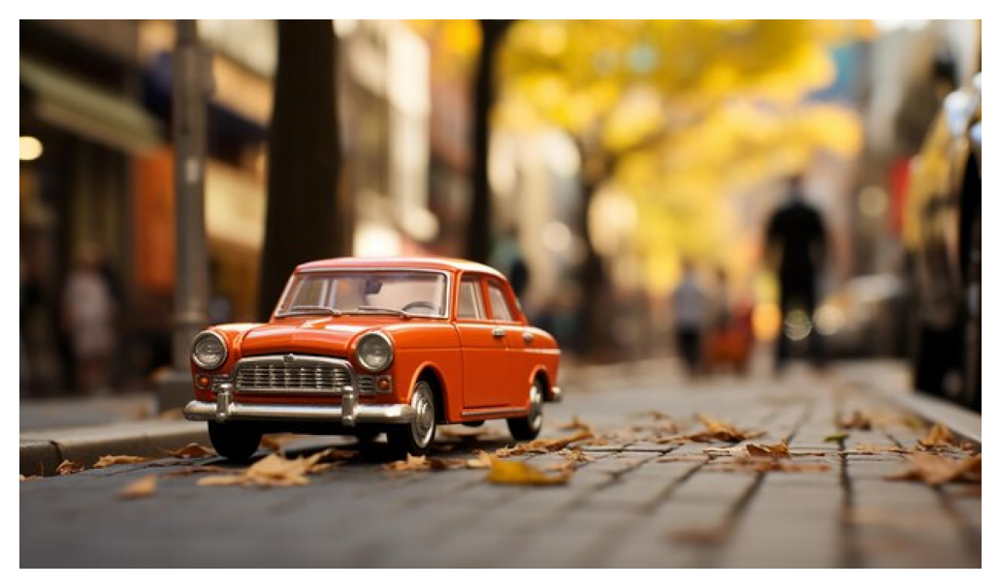

In [30]:
image_embeddings = []

for file in files:
    image = preprocess_viT_32(Image.open(file).convert("RGB")).unsqueeze(0)
    with torch.no_grad():
        image_embeddings.append(model_viT_32.encode_image(image).cpu().numpy())

image_embeddings = np.vstack(image_embeddings)

def process_input(user_input):
    if isinstance(user_input, str):
        # Process as text
        text = user_input
        text_embedding = model_viT_32.encode_text(clip.tokenize(text)).cpu().detach().numpy()

        # Find the closest image
        similarities = (image_embeddings @ text_embedding.T).squeeze()
        best_match_idx = np.argmax(similarities)
        best_image = Image.open(files[best_match_idx])
        
        # Display the image
        plt.imshow(best_image)
        plt.axis('off')
        plt.show()

    elif isinstance(user_input, Image.Image):
        # Process as image
        image = preprocess_viT_32(user_input).unsqueeze(0)
        with torch.no_grad():
            image_embedding = model_viT_32.encode_image(image).cpu().numpy()

        # Find the closest text query
        query_embeddings = model_viT_32.encode_text(clip.tokenize(QUERIES)).detach().numpy()
        similarities = (query_embeddings @ image_embedding.T).squeeze()
        best_match_idx = np.argmax(similarities)
        best_query = QUERIES[best_match_idx]

        return best_query

# Example usage
# If the input is an image:
image_input = Image.open('982bbd5f815d9c69ac5fc10c8037dc80.jpg')
description = process_input(image_input)
print("Description:", description)

# If the input is a question:
text_input =  "red toy car"
process_input(text_input)

Query: A red toy car:


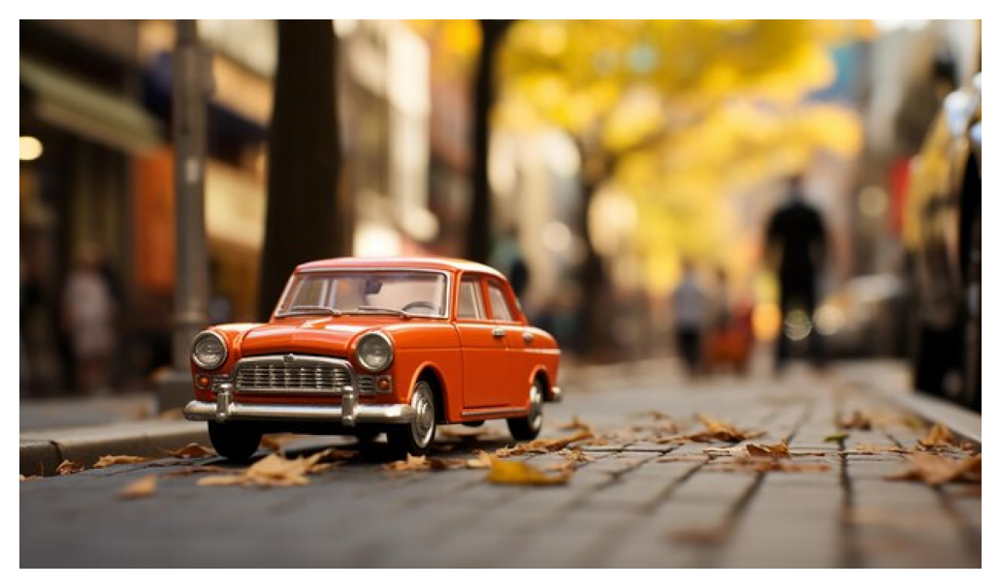

Query: A blue toy car:


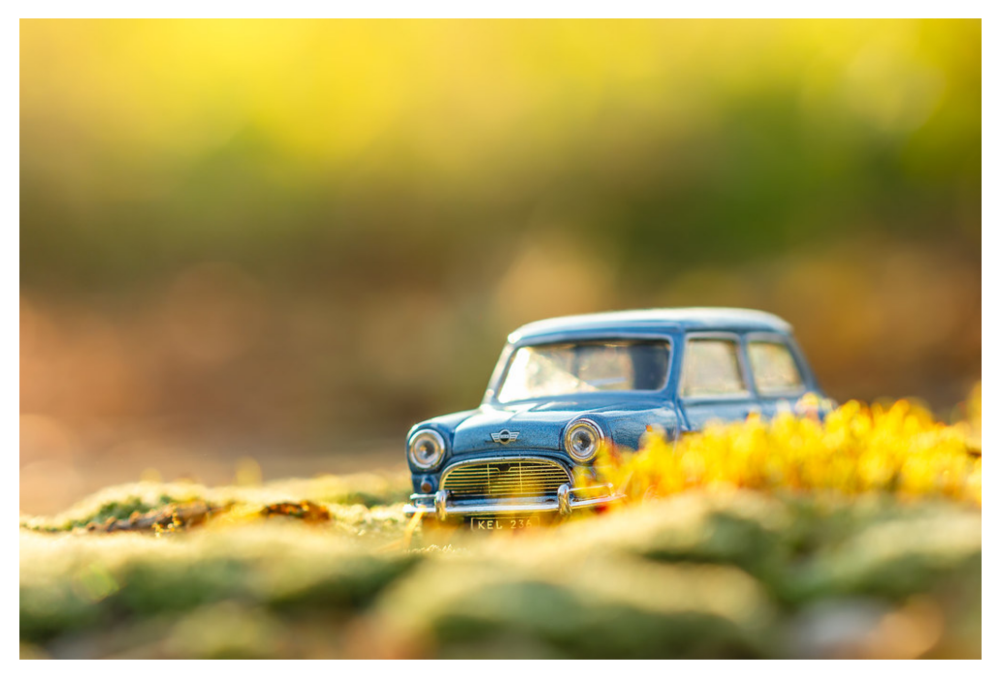

Query: A pink toy car:


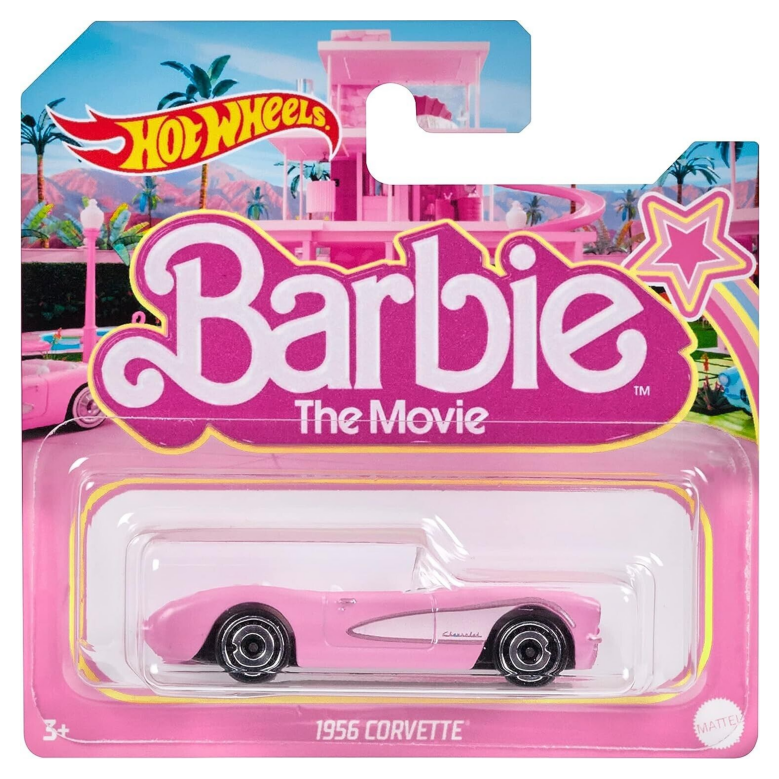

Query: A black toy car:


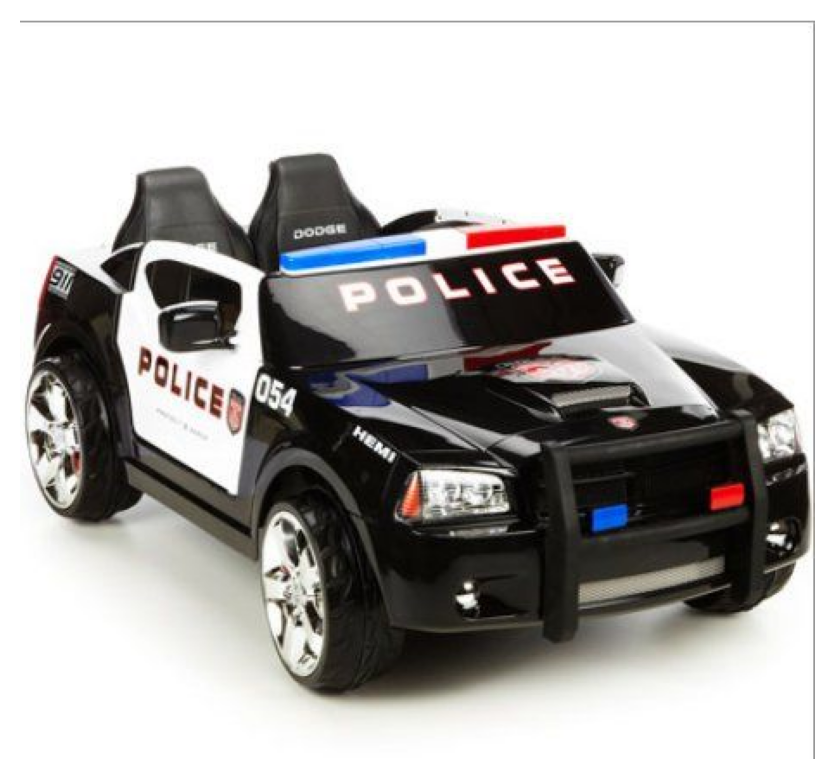

Query: A white toy car:


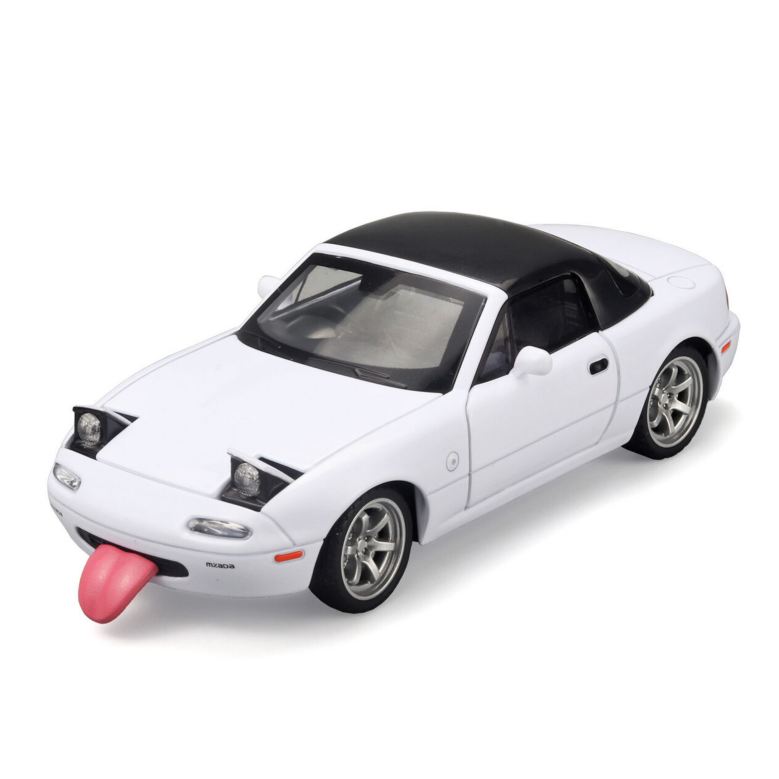

Query: A silver toy car:


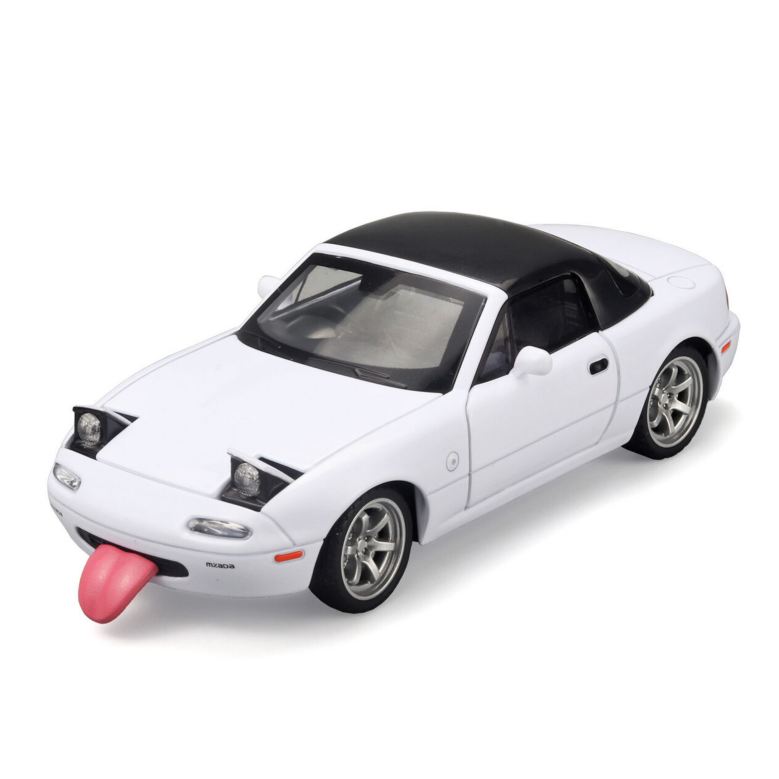

Query: A toy car with racing stripes:


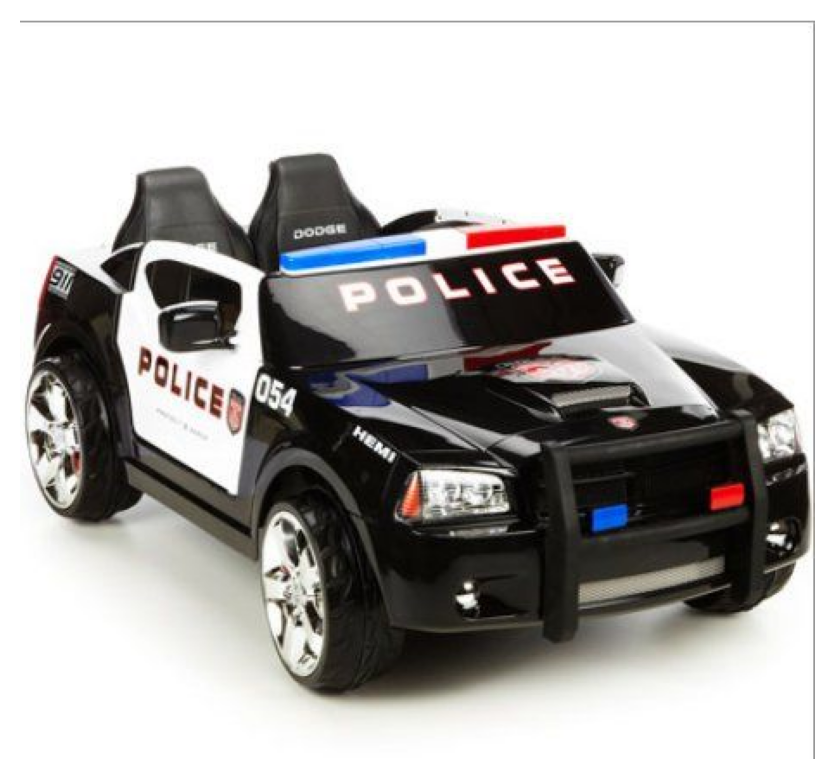

Query: A toy car with big wheels:


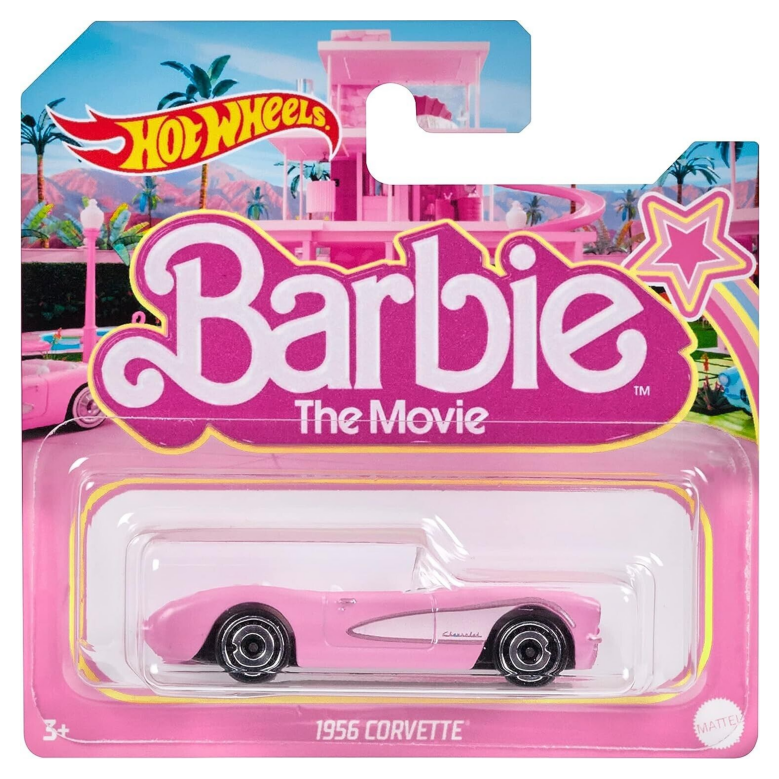

Query: A vintage toy car:


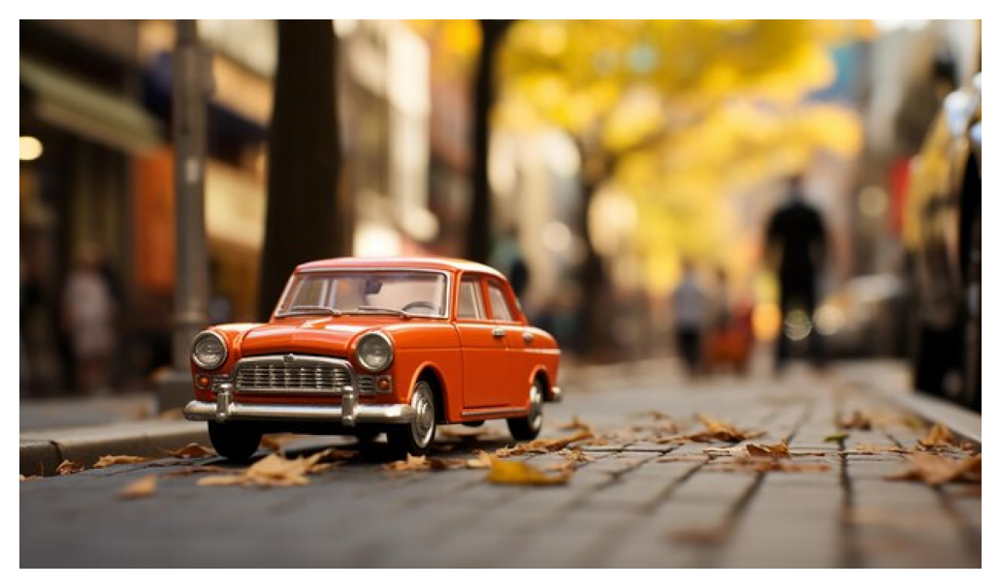

Query: A toy car collection:


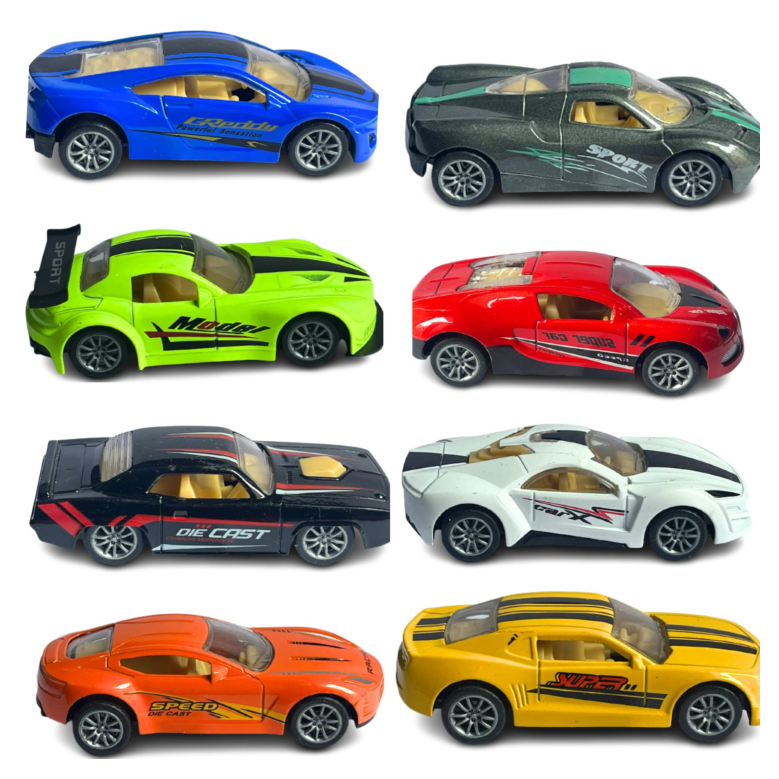

Query: A toy car in a box:


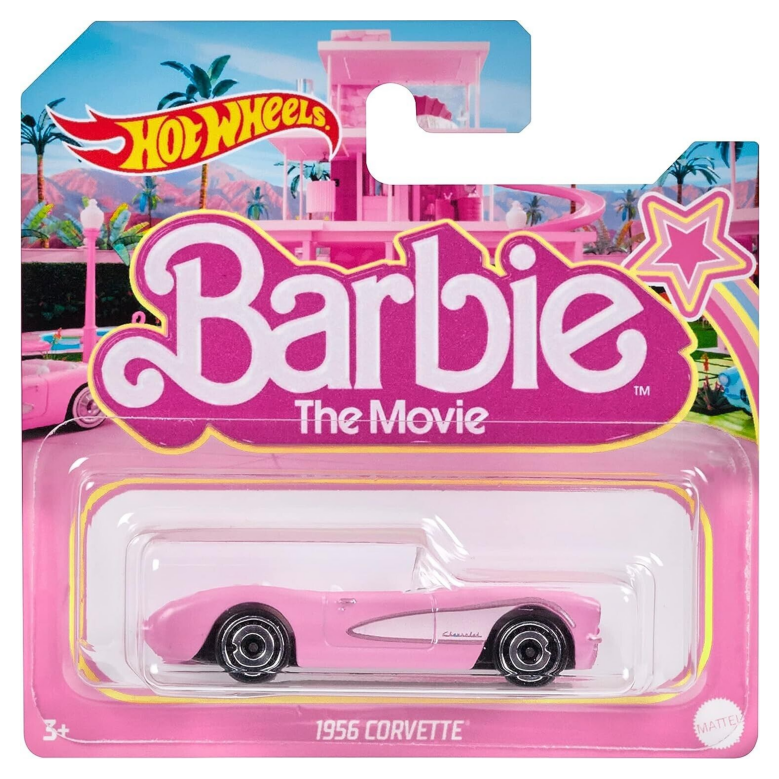

Query: A toy car with a driver inside:


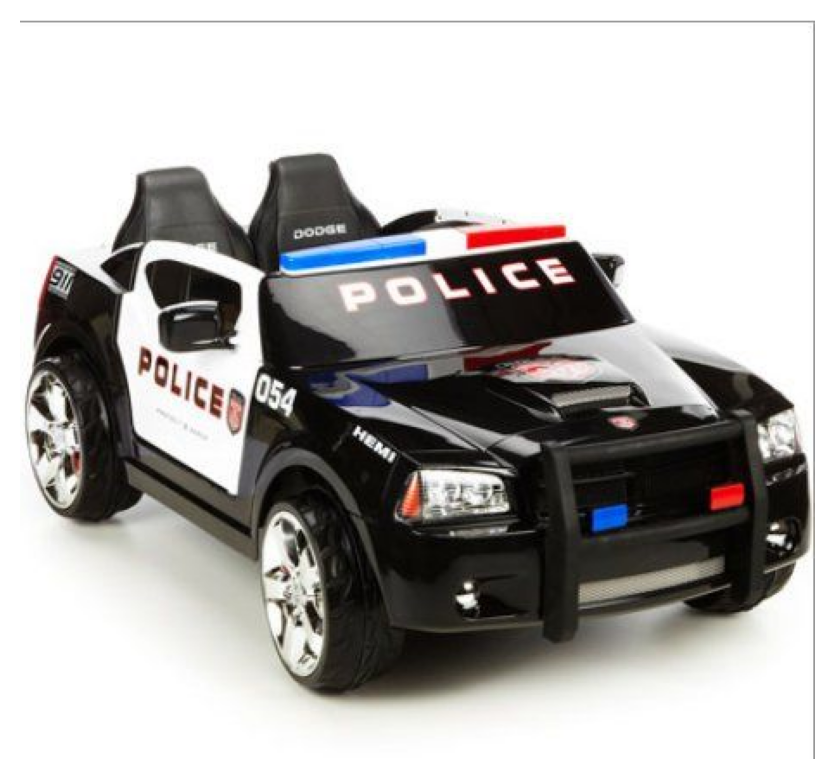

Query: A toy car with many passengers inside:


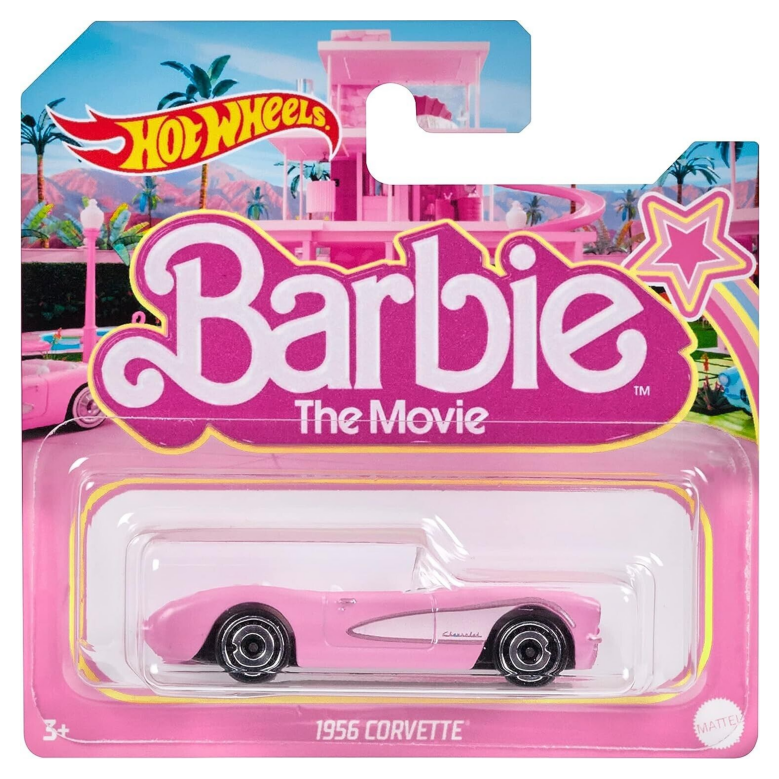

Query: A toy car with an open roof:


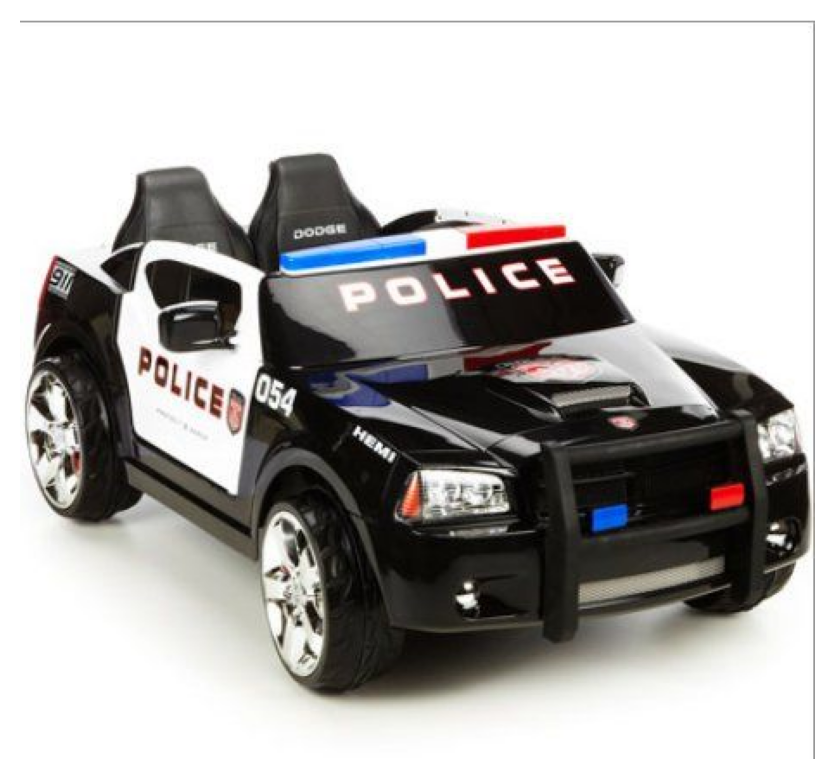

Query: A toy car and a toy truck:


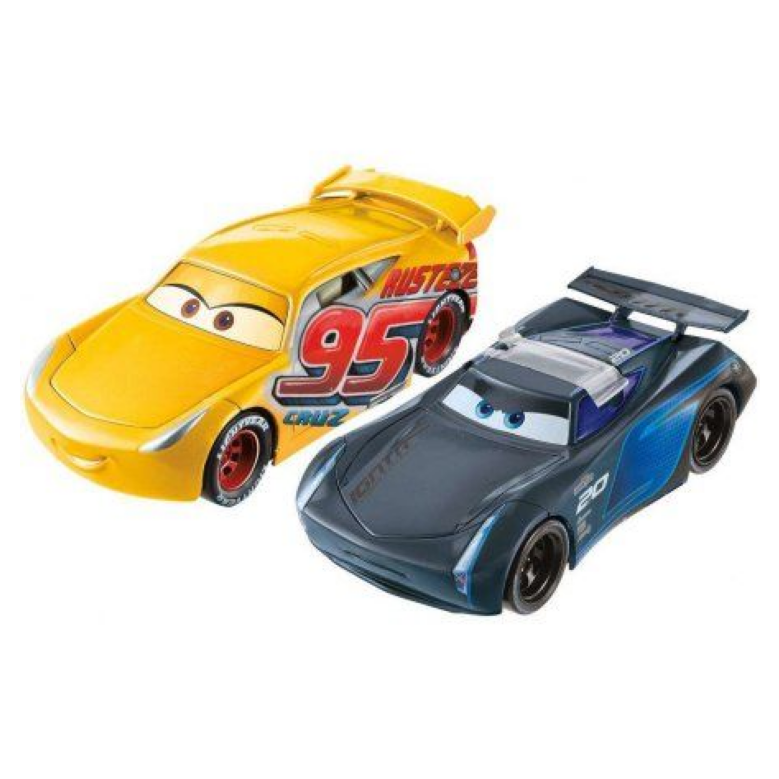

Query: A toy car on top of a toy truck:


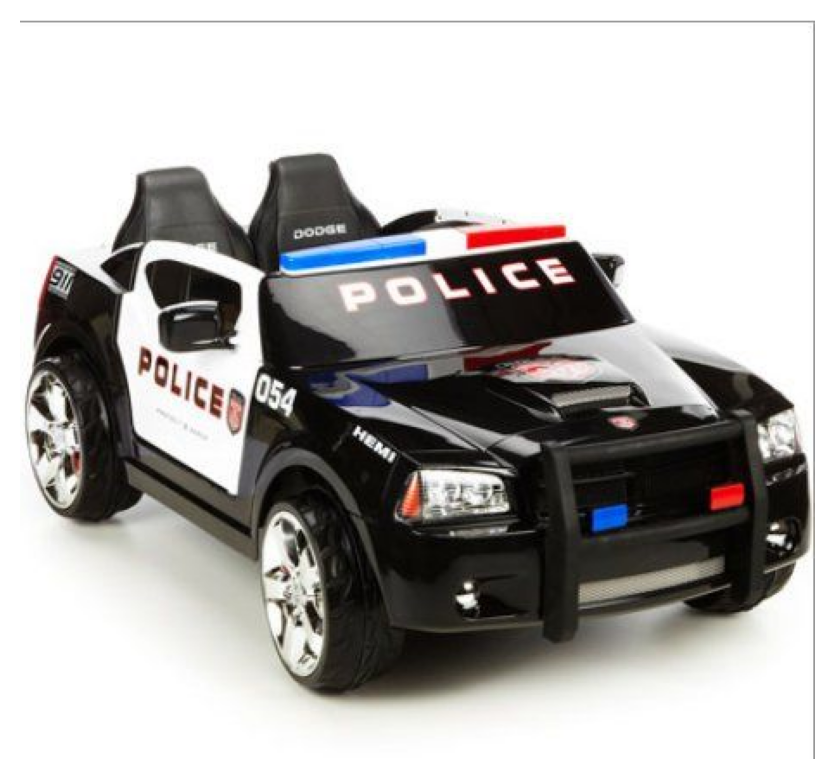

Query: A GTR toy car:


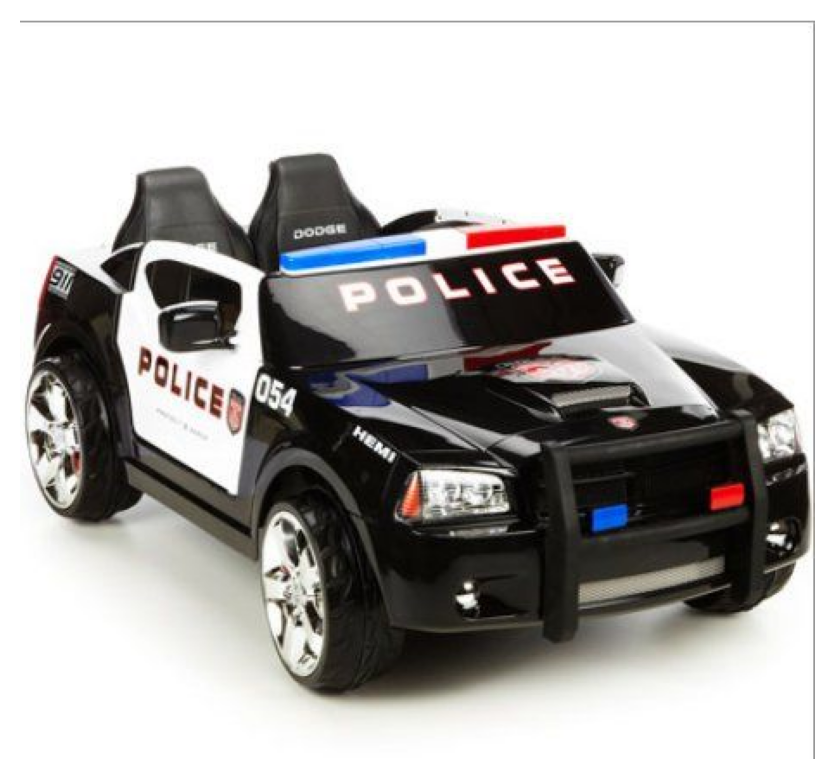

Query: A Mazda toy car:


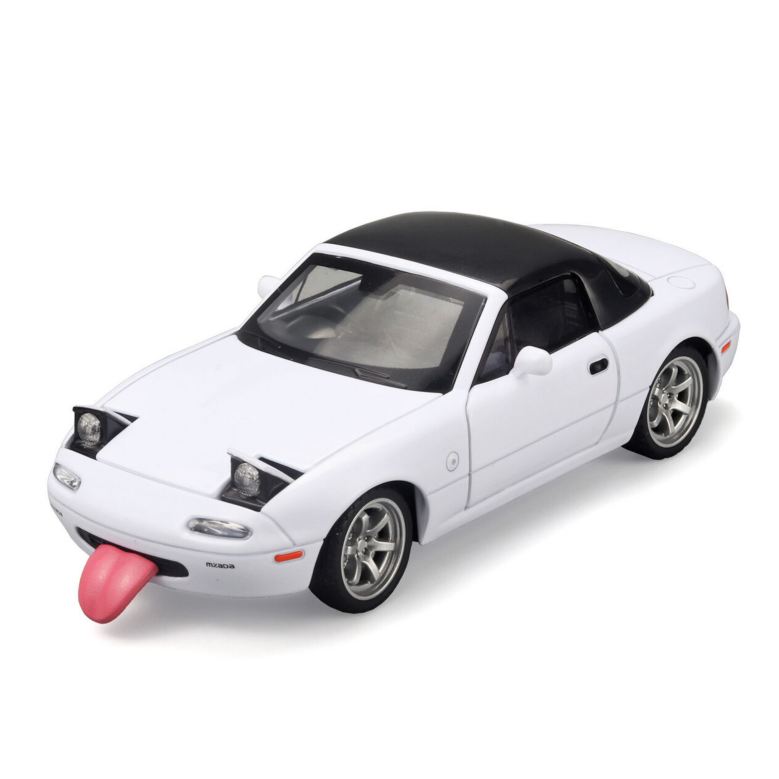

Query: A Bugatti toy car:


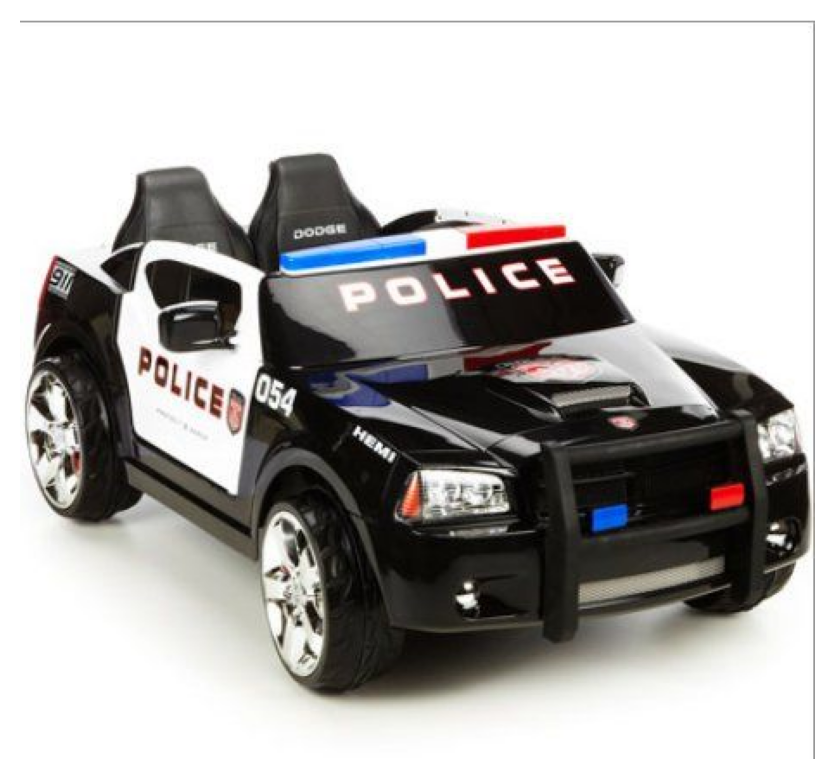

Query: Barbie toy car:


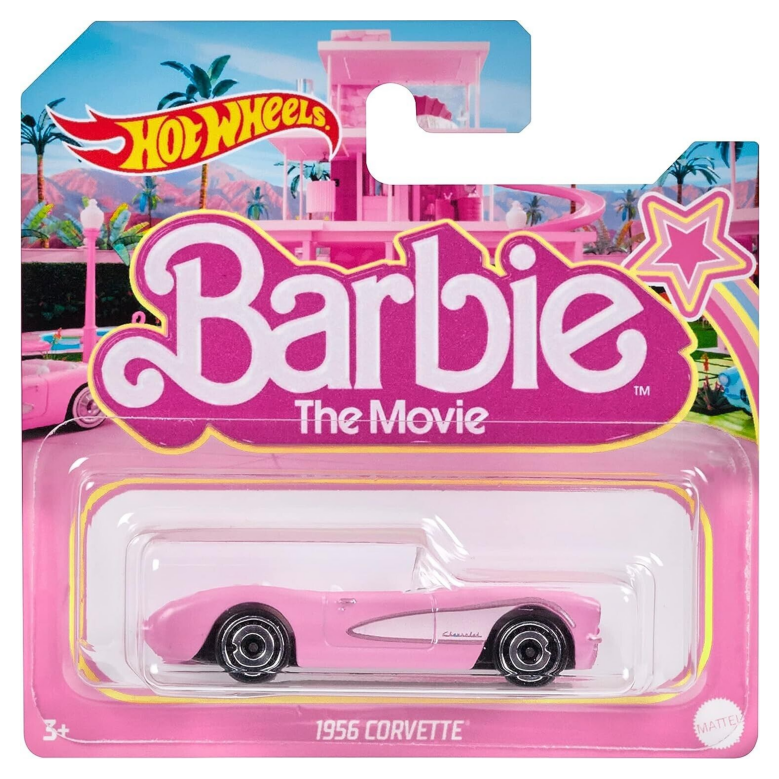

Query: Two toy cars:


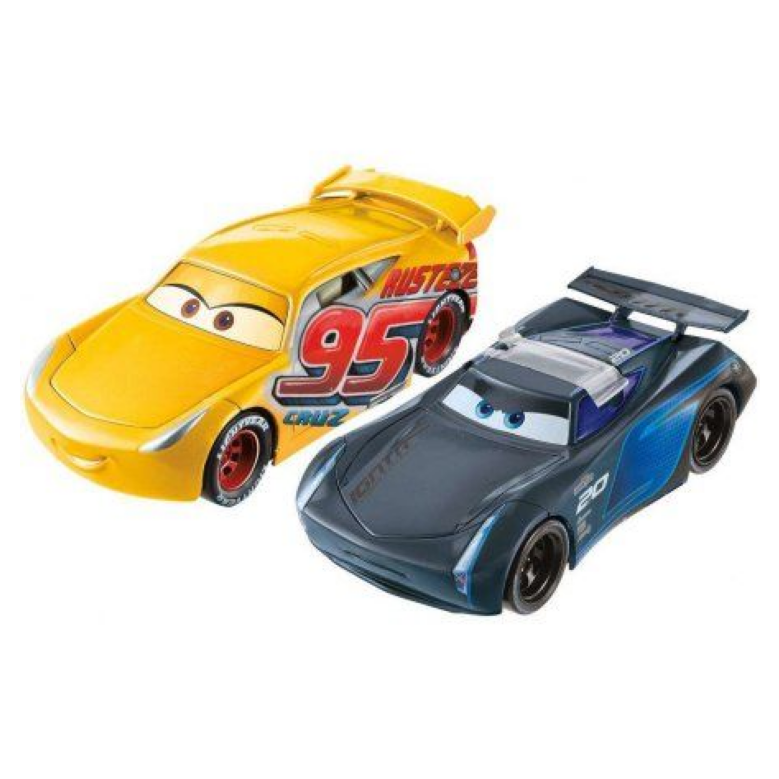

Query: Four toy cars:


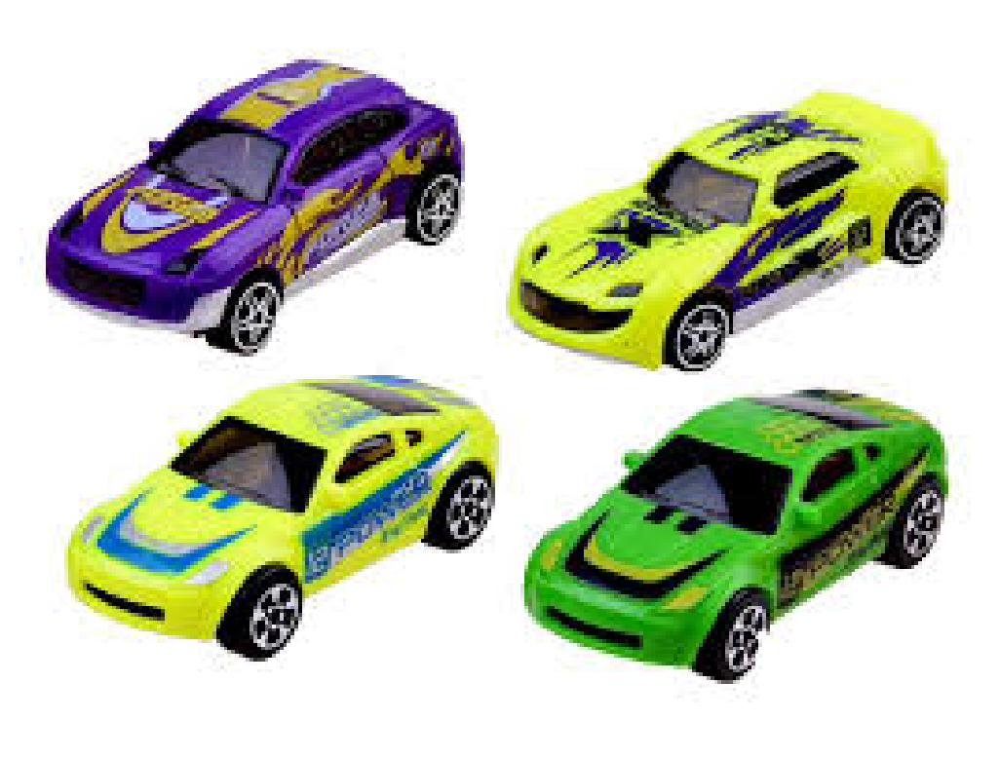

Query: Eight toy cars:


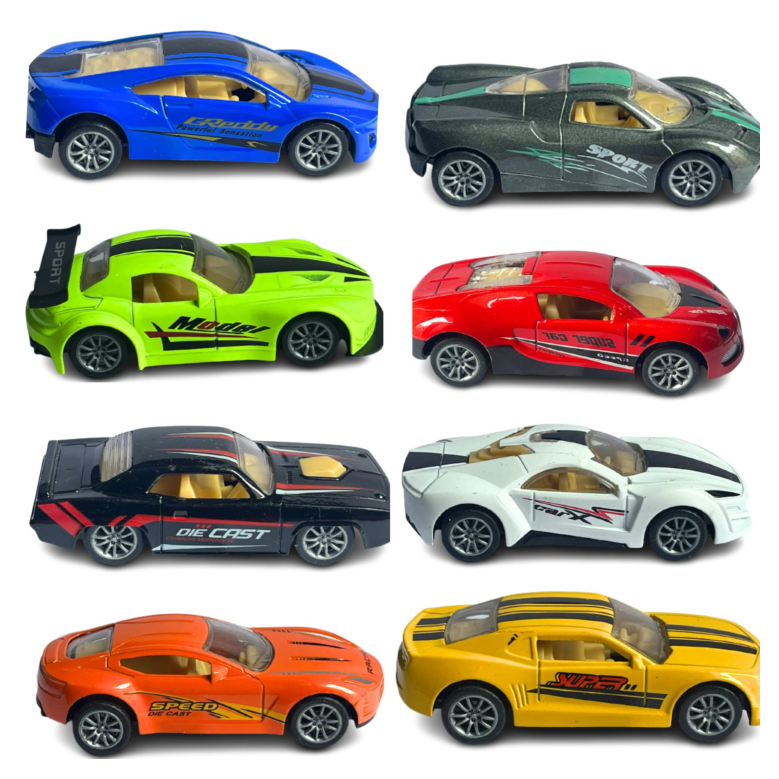

Query: A toy car in the UK:


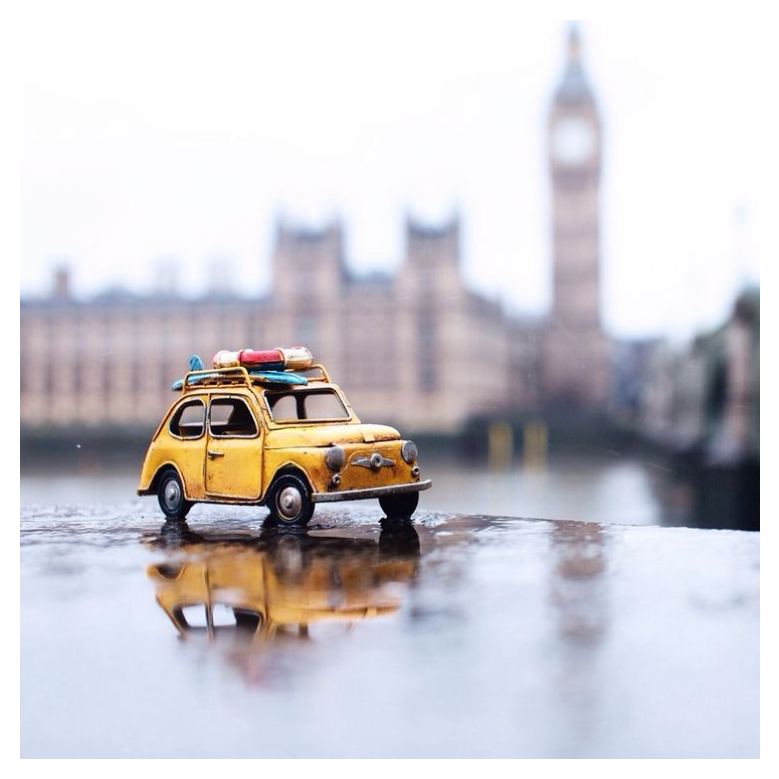

Query: A toy car moving in a city:


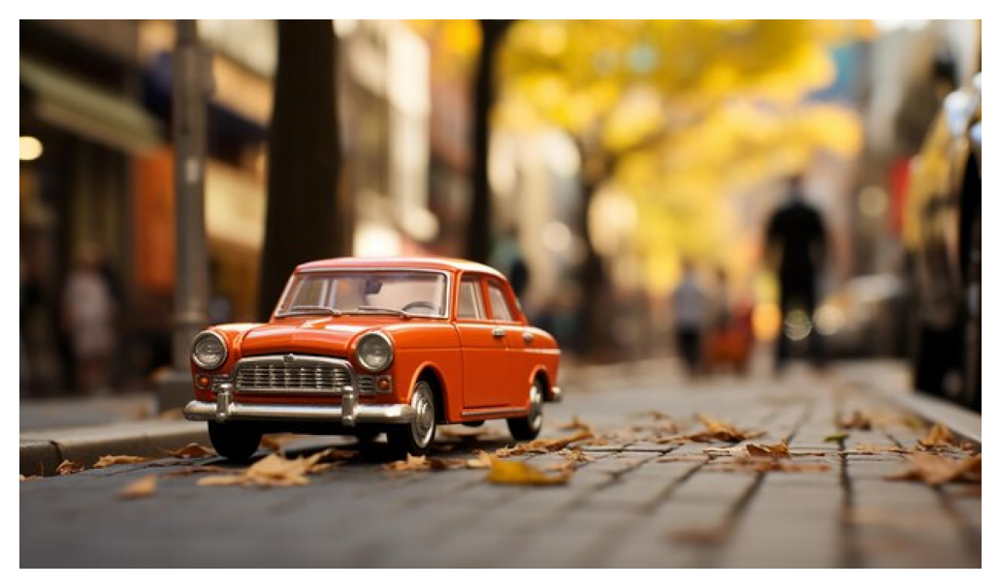

Query: A police toy car:


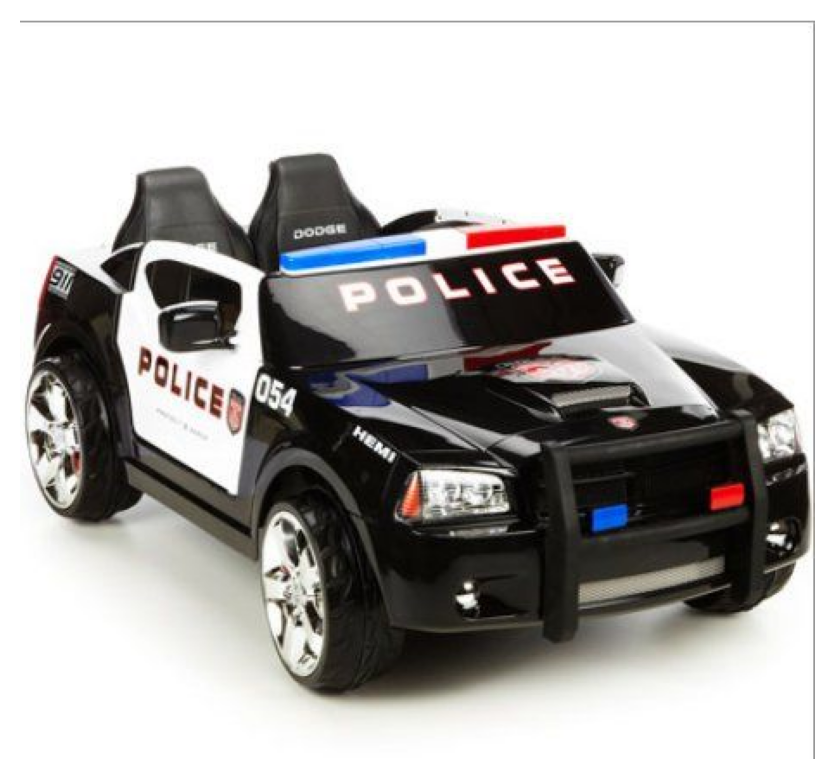

In [31]:
image_embeddings = []
for file in files:
    image = preprocess_viT_32(Image.open(file).convert("RGB")).unsqueeze(0).cpu()
    with torch.no_grad():
        image_embeddings.append(model_viT_32.encode_image(image).cpu().numpy())
image_embeddings = np.vstack(image_embeddings)

# Encode text queries
query_embeddings = model_viT_32.encode_text(clip.tokenize(QUERIES)).cpu().detach().numpy()

# Compute similarity
similarities = np.dot(query_embeddings, image_embeddings.T)

# Find the best match
best_match_indices = np.argmax(similarities, axis=1)
for i, best_idx in enumerate(best_match_indices):
    print(f"Query: {QUERIES[i]}:")
    image = Image.open(files[best_idx])
    plt.imshow(image)
    plt.axis('off')
    plt.show()